## Image Processing Techniques Using OpenCV

## Data Overview

A facial recognition system is a technology capable of matching a human face from a digital image or a video frame against a database of faces, typically employed to authenticate users through ID verification services, works by pinpointing and measuring facial features from a given image.


* The dataset contains THREE sub-directories for training, testing & validation. These directories 250, 60 & 60 samples each.
* Each directory contains FIVE classes which present one avenger.

## Objective

Trying different image processing techniques using OpenCV.

<div>
    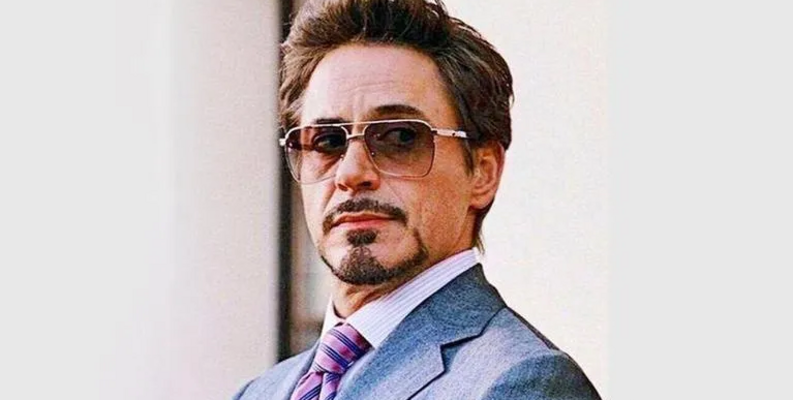
</div>

----------
## Importing Libraries

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

-----------
## Reading Data

In [2]:
#I_am_gonna_work_on_the_test_sub_director
path= '../input/avengers-faces-dataset/images/test'
images= ['../input/avengers-faces-dataset/images/test/{}'.format(i) for i in os.listdir(path)]

In [3]:
images

['../input/avengers-faces-dataset/images/test/chris_evans',
 '../input/avengers-faces-dataset/images/test/mark_ruffalo',
 '../input/avengers-faces-dataset/images/test/scarlett_johansson',
 '../input/avengers-faces-dataset/images/test/chris_hemsworth',
 '../input/avengers-faces-dataset/images/test/robert_downey_jr']

In [4]:
path_rdj= '../input/avengers-faces-dataset/images/test/robert_downey_jr'
RDJ= ['../input/avengers-faces-dataset/images/test/robert_downey_jr/{}'.format(i) for i in os.listdir(path_rdj)]

In [5]:
RDJ

['../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr42.png',
 '../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr39.png',
 '../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr13.png',
 '../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr36.png',
 '../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr41.png',
 '../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr21.png',
 '../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr22.png',
 '../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr45.png',
 '../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr51.png',
 '../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr44.png',
 '../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr25.png',
 '../input/avengers-faces-datase

-------
## Exploring Data

In [6]:
from PIL import Image

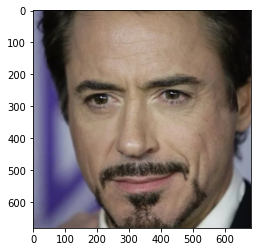

In [7]:
img = Image.open('../input/avengers-faces-dataset/images/test/robert_downey_jr/robert_downey_jr42.png')
plt.imshow(np.asarray(img))

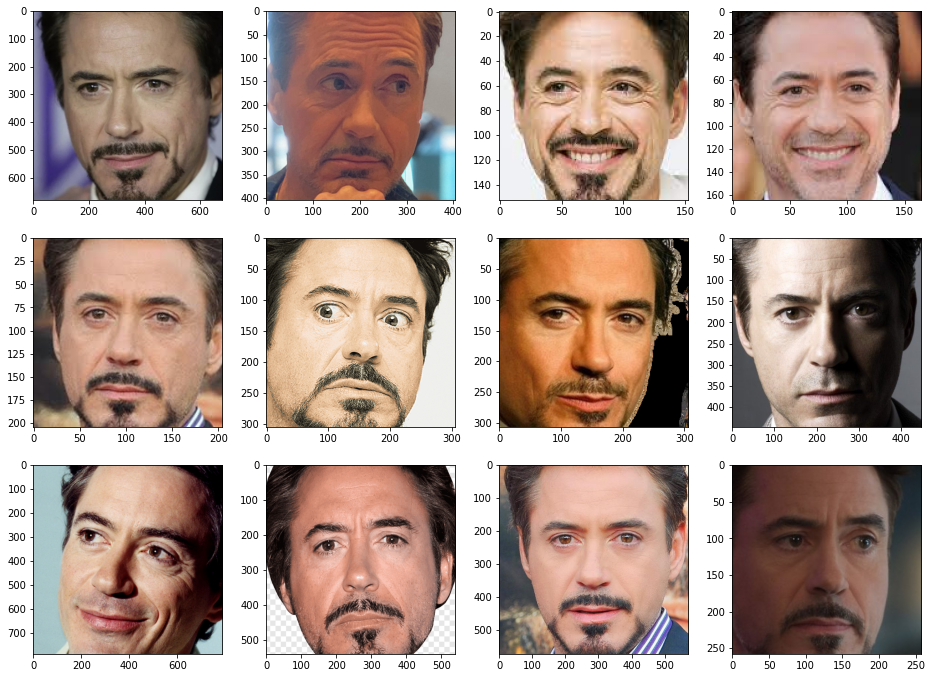

In [8]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):

    img= cv2.imread(i, cv2.IMREAD_COLOR)   
    show_img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.subplot(4, 4, x+1)
    plt.imshow(show_img,cmap='gray')
    
plt.show()

--------
## Image Preprocessing Techniques

### 1. Gray-Scaling

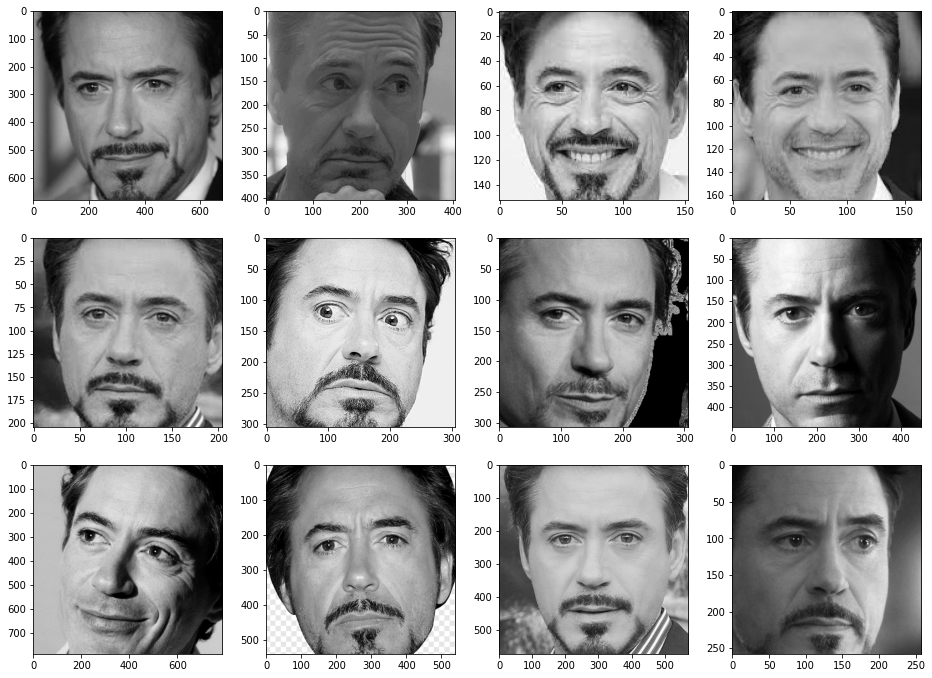

In [9]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):

    img= cv2.imread(i,0)
    
    plt.subplot(4, 4, x+1)
    plt.imshow(img,cmap='gray')
    
plt.show()

### 2. Inverse Thresholding

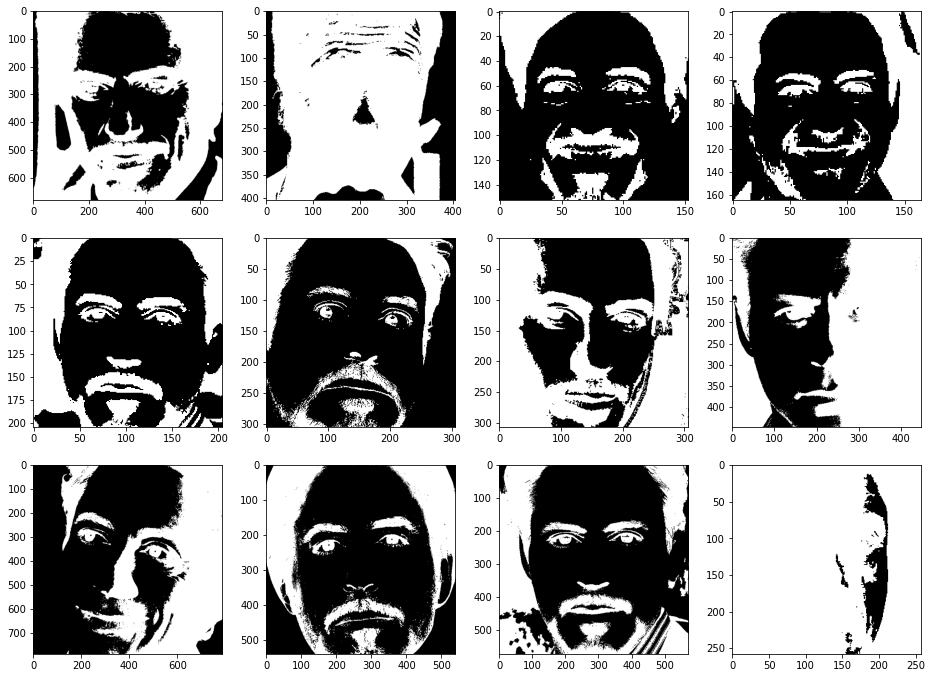

In [10]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):

    #The_source_image_for_a_threshold_should_be_gray_scaled
    img= cv2.imread(i,0)
    
    ret,thresh= cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
    
    plt.subplot(4, 4, x+1)
    plt.imshow(thresh,cmap='gray')
    
plt.show()

### 3. Adaptive Thresholding

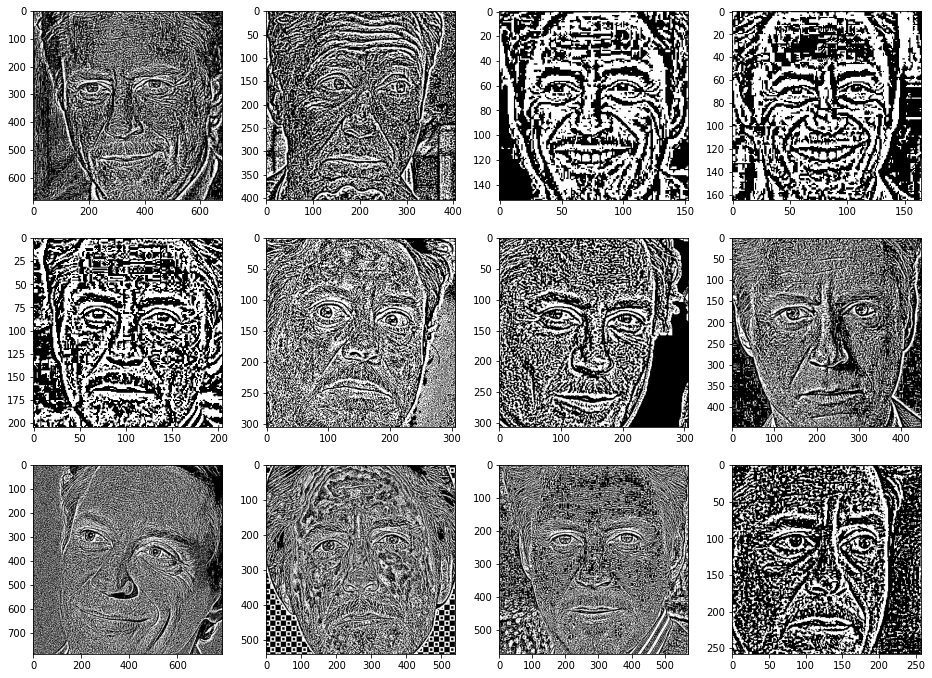

In [11]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):

    #The_source_image_for_a_threshold_should_be_gray_scaled
    img= cv2.imread(i,0)
    
    thresh= cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,0)   #Block_size_must_be_odd 
    
    plt.subplot(4, 4, x+1)
    plt.imshow(thresh,cmap='gray')
    
plt.show()

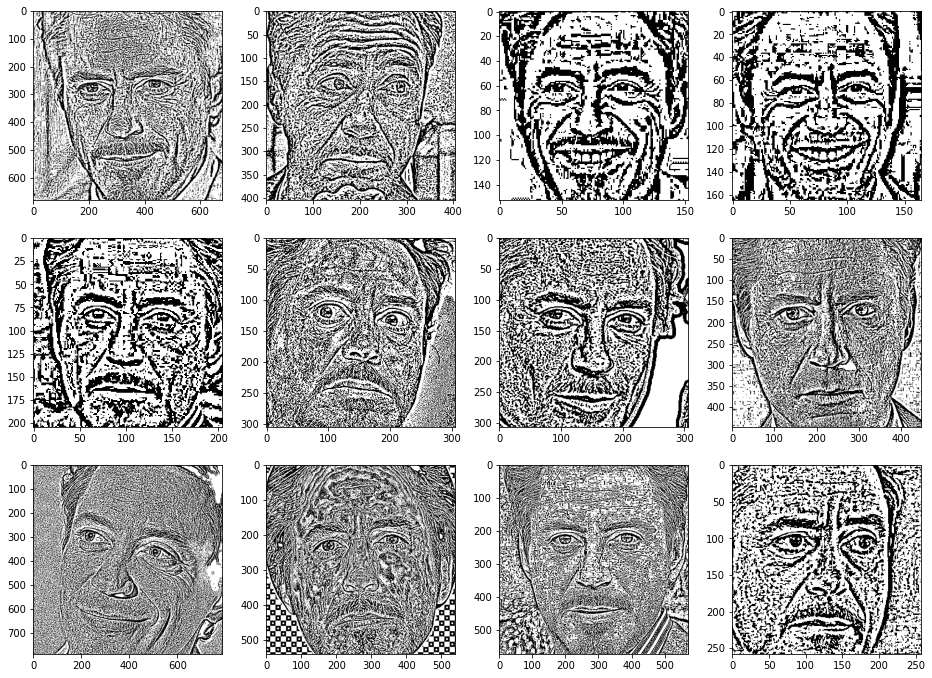

In [12]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):

    #The_source_image_for_a_threshold_should_be_gray_scaled
    img= cv2.imread(i,0)
    
    thresh= cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,13,1)  #Block_size_must_be_odd 
    
    plt.subplot(4, 4, x+1)
    plt.imshow(thresh,cmap='gray')
    
plt.show()

### 4. Histograming
#### Image Histogram in OpenCV ---> A histogram is a very important tool in Image processing. It is a graphical representation of the distribution of data. An image histogram gives a graphical representation of the distribution of pixel intensities in a digital image.

#### First, we are gonna read the images using OpenCV:

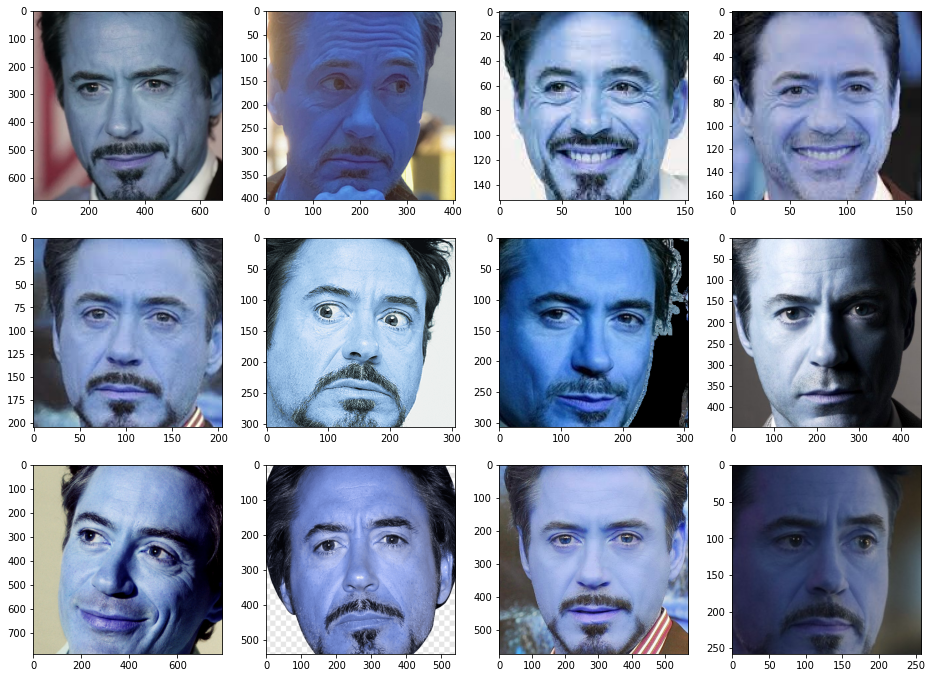

In [13]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR)   

    plt.subplot(4, 4, x+1)
    plt.imshow(img,cmap='gray')
    
plt.show()

#### THREE Color Histogram:

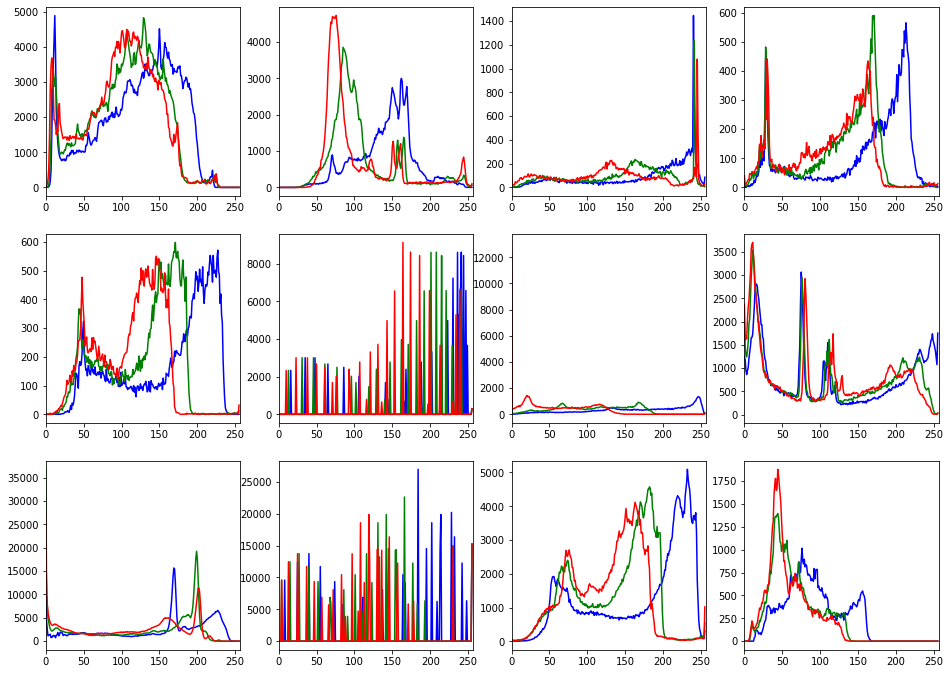

In [14]:
plt.figure(figsize=(16,16))

color = ('b','g','r')

for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR) 
    show_img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)    #Converting_the_image_ordering_from_BGR_to_RGB
    
    plt.subplot(4, 4, x+1)

    #Applying_Histogram
    for j,col in enumerate(color):
        histr = cv2.calcHist([show_img],[j],None,[256],[0,256])
        plt.plot(histr,color= col)
        plt.xlim([0,256])

plt.show()

#### Image Masking 

In [15]:
for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR)   
    print(img.shape)

(681, 681, 3)
(405, 405, 3)
(153, 153, 3)
(165, 165, 3)
(205, 205, 3)
(306, 306, 3)
(307, 307, 3)
(448, 448, 3)
(789, 789, 3)
(540, 540, 3)
(572, 572, 3)
(258, 258, 3)


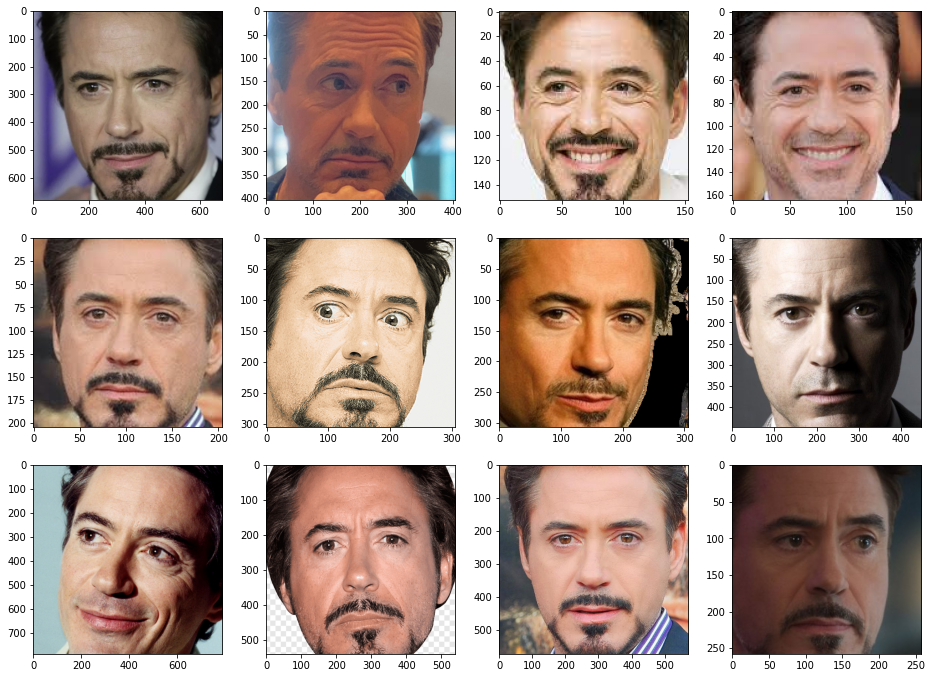

In [16]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR)
    show_img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.subplot(4, 4, x+1)

    #Creating_Mask
    Mask = np.zeros(img.shape[:2], np.uint8)
    Mask[0:2000, 0:2000] = 255   #Adjusting_the_mask_size
    Masked_img = cv2.bitwise_and(img, img, mask= Mask)
    Show_masked_img = cv2.bitwise_and(show_img, show_img, mask= Mask)
    
    plt.imshow(Show_masked_img,cmap='gray')

plt.show()

#### Three Color Histogram after Masking

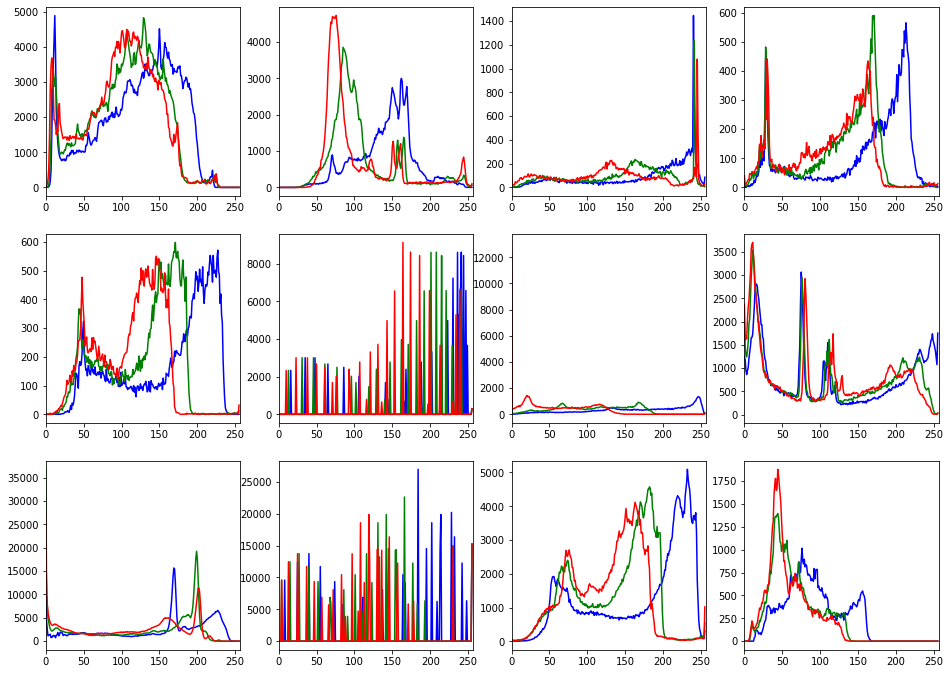

In [17]:
plt.figure(figsize=(16,16))

color = ('b','g','r')

for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR)
    show_img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.subplot(4, 4, x+1)
    
    #Creating_Mask
    Mask = np.zeros(img.shape[:2], np.uint8)
    Mask[0:2000, 0:2000] = 255   #Adjusting_the_mask_size
    Masked_img = cv2.bitwise_and(show_img, show_img, mask= Mask)
    
    #Applying_Histogram
    for j,col in enumerate(color):
        
        histr = cv2.calcHist([Masked_img],[j],mask= Mask, histSize=[256], ranges=[0,256])
        plt.plot(histr,color= col)
        plt.xlim([0,256])

plt.show()

---------
- **By observing the images we can notice the enhancement in the contrast**
-------

### 5. Histogram Eqalization

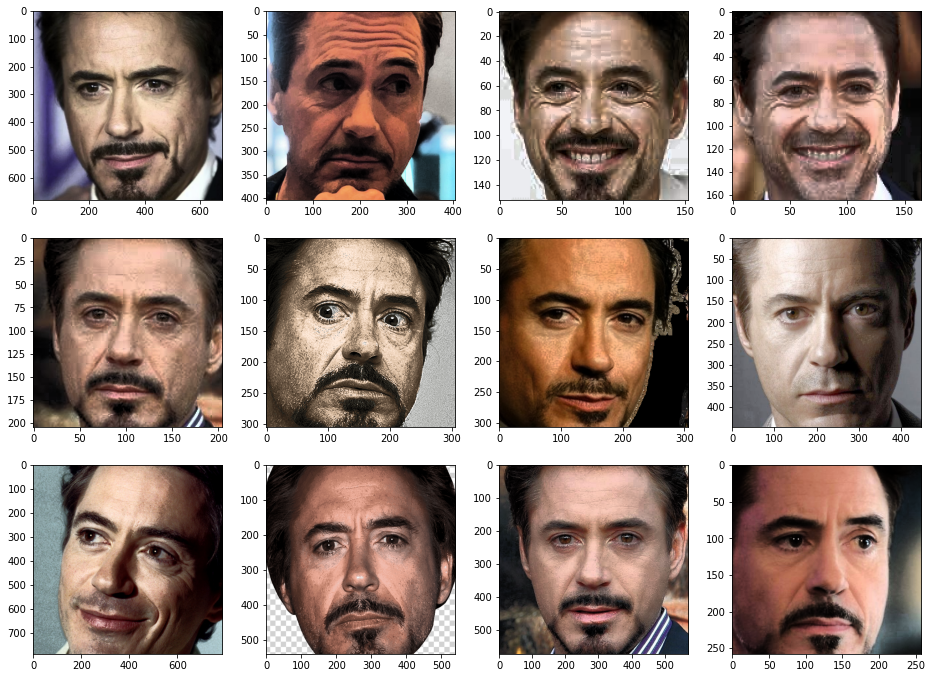

In [18]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR)
    hsv= cv2.cvtColor(img, cv2.COLOR_BGR2HSV)   #_Convert_to_HSV_colorspace
    
    plt.subplot(4, 4, x+1)

    #Creating_Mask
    hsv[:,:,2]= cv2.equalizeHist(hsv[:,:,2])
    Meq_color= cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    
    plt.imshow(Meq_color,cmap='gray')

plt.show()

---------
## Applying Filters

### Color Gradient 

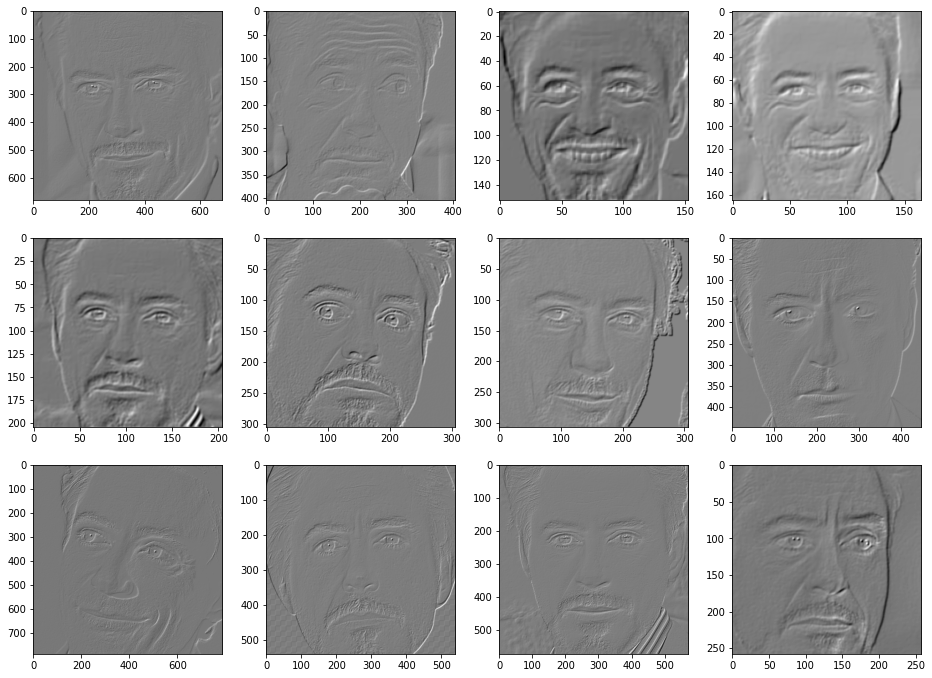

In [19]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):

    #The_source_image_should_be_gray_scaled
    img= cv2.imread(i,0)
    
    sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
    sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

    blended = cv2.addWeighted(src1=sobelx,alpha=0.5,src2=sobely,beta=0.5,gamma=0)  
    
    plt.subplot(4, 4, x+1)
    plt.imshow(blended,cmap='gray')
    
plt.show()

### Canny Edge Detection

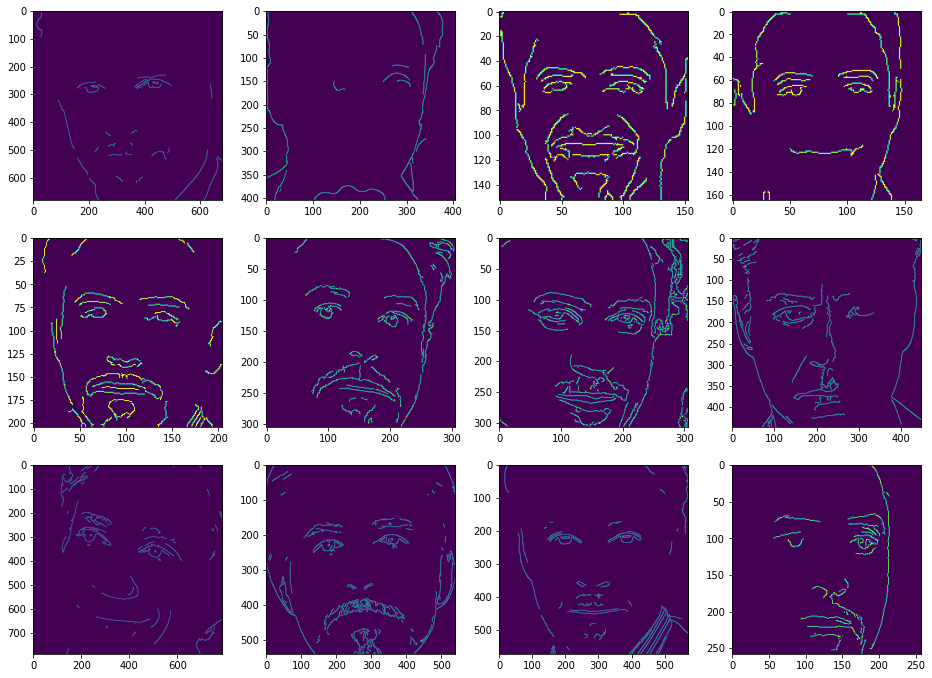

In [20]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR) 
    blurred_img= cv2.blur(img,ksize=(5,5))   #Dropping_minor_edges
    
    #Choosing_Thresholds
    med_val= np.median(blurred_img)
    lower= int(max(0, 0.7*med_val))   
    upper= int(min(255,1.3*med_val))
    
    edges= cv2.Canny(image=blurred_img, threshold1=lower, threshold2=upper)

    plt.subplot(4, 4, x+1)
    plt.imshow(edges)
    
plt.show()

In [21]:
for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR)   
    blurred_img= cv2.blur(img,ksize=(5,5))   #Dropping_minor_edges

    med_val= np.median(blurred_img)
    lower= int(max(0, 0.7*med_val))   
    upper= int(min(255,1.3*med_val))
    
    print('(', lower,',', upper, ')')

( 79 , 146 )
( 71 , 132 )
( 112 , 209 )
( 101 , 188 )
( 97 , 180 )
( 134 , 249 )
( 65 , 122 )
( 66 , 123 )
( 106 , 197 )
( 95 , 178 )
( 106 , 197 )
( 45 , 84 )


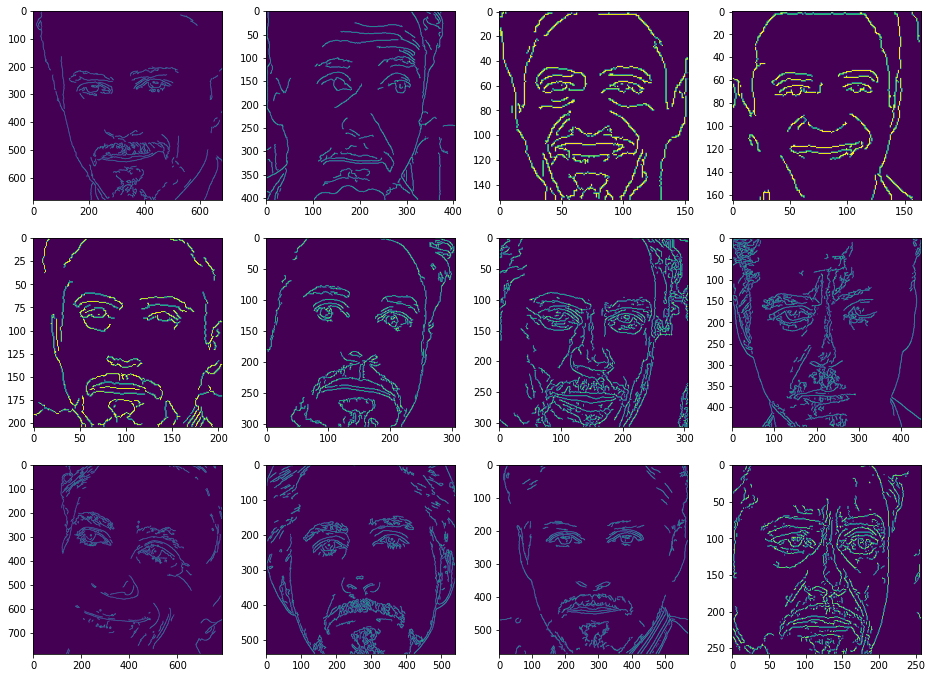

In [22]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR) 
    blurred_img= cv2.blur(img,ksize=(5,5))   #Dropping_minor_edges
    
    #Choosing_Thresholds
    med_val= np.median(blurred_img)
    lower= int(max(0, 0.7*med_val))   
    upper= int(min(255,1.3*med_val))
    
    edges= cv2.Canny(image=blurred_img, threshold1=lower-40, threshold2=upper-60)   #Adjusting_the_thresholds

    plt.subplot(4, 4, x+1)
    plt.imshow(edges)
    
plt.show()

### Harris Corner Detection

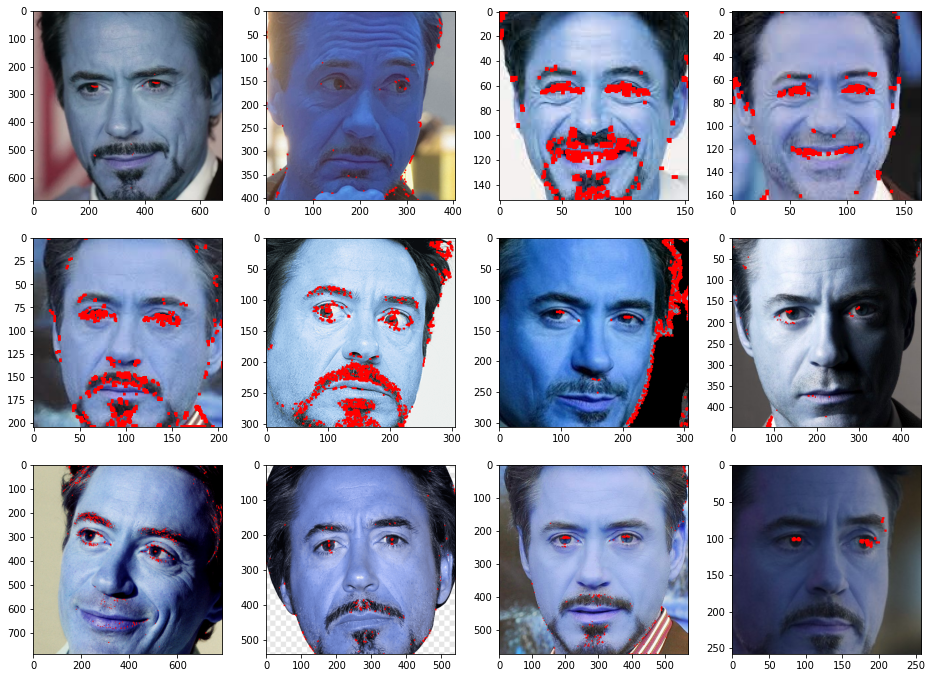

In [23]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):

    img= cv2.imread(i, cv2.IMREAD_COLOR)
    gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)

    # Corner Harris Detection
    dst= cv2.cornerHarris(src=gray,blockSize=2,ksize=3,k=0.04)
    dst= cv2.dilate(dst,None)
    
    img[dst>0.01*dst.max()]=[255,0,0]

    plt.subplot(4, 4, x+1)
    plt.imshow(img)
    
plt.show()

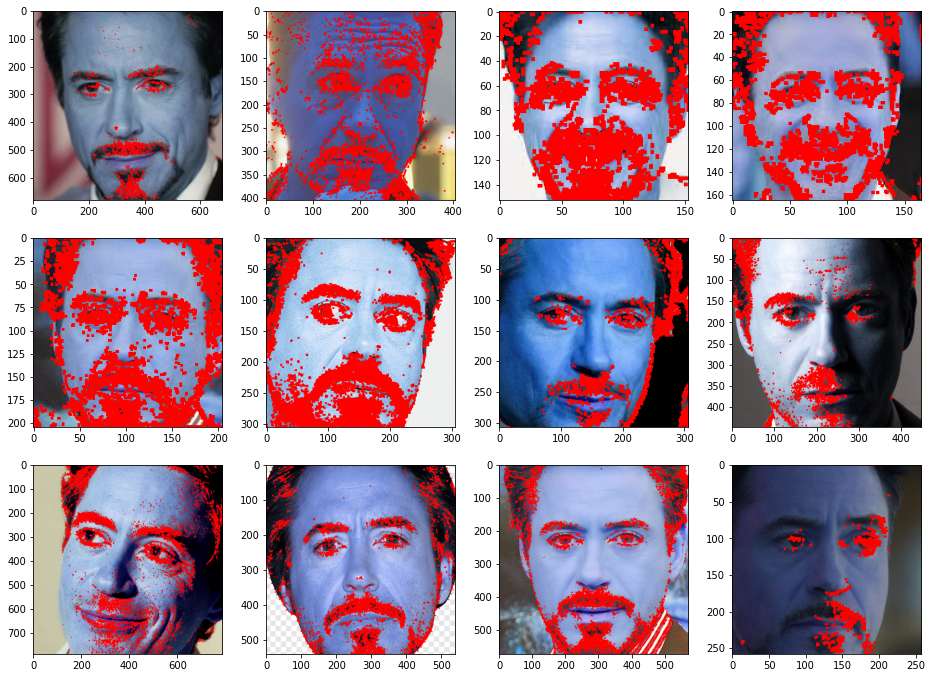

In [24]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):

    img= cv2.imread(i, cv2.IMREAD_COLOR)
    gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)

    # Corner Harris Detection
    dst= cv2.cornerHarris(src=gray,blockSize=2,ksize=3,k=0.04)
    dst= cv2.dilate(dst,None)
    
    img[dst>0.0002*dst.max()]=[255,0,0]

    plt.subplot(4, 4, x+1)
    plt.imshow(img)
    
plt.show()

### Gaussian Blurring

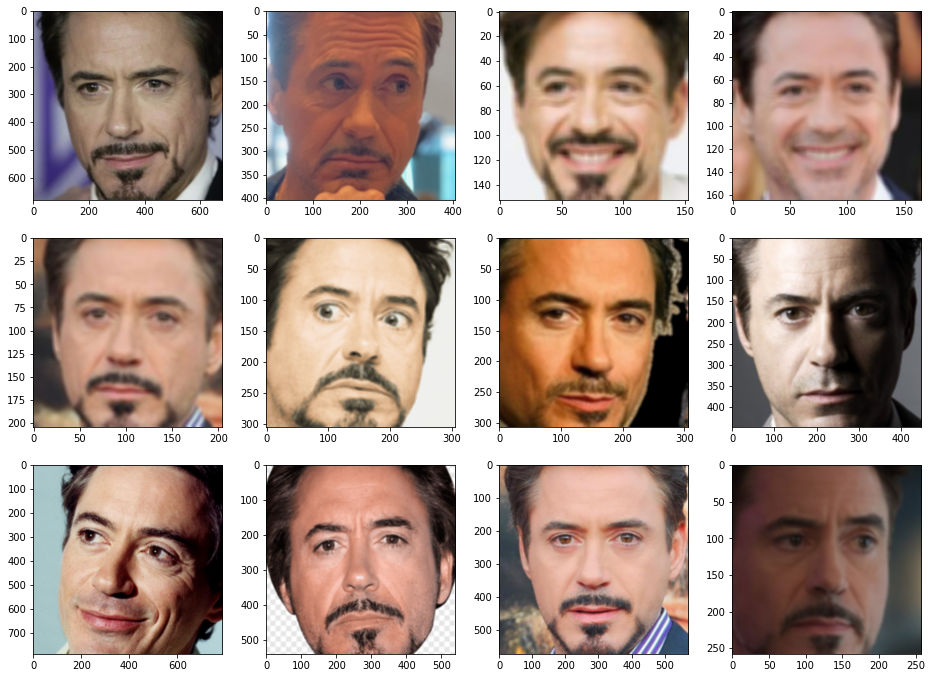

In [25]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR)
    show_img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    blurred_img = cv2.GaussianBlur(show_img,(5,5),12)
    
    plt.subplot(4, 4, x+1)
    plt.imshow(blurred_img)

plt.show()

### Gamma Correction

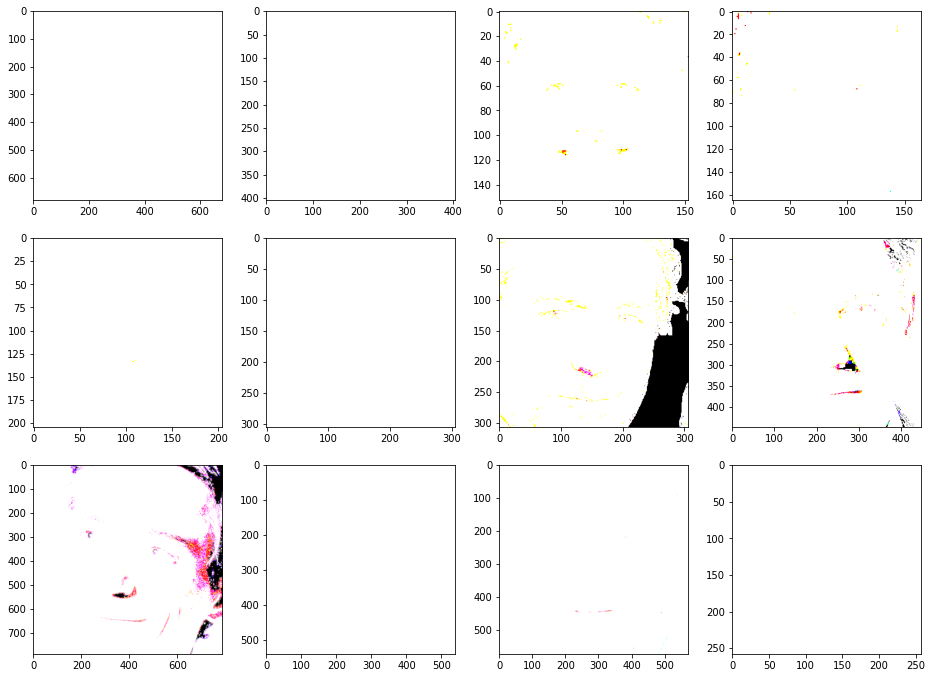

In [26]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR)
    show_img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    gamma= 1.8
    effected_image= np.power(show_img, gamma)
    
    plt.subplot(4, 4, x+1)
    plt.imshow(effected_image)

plt.show()

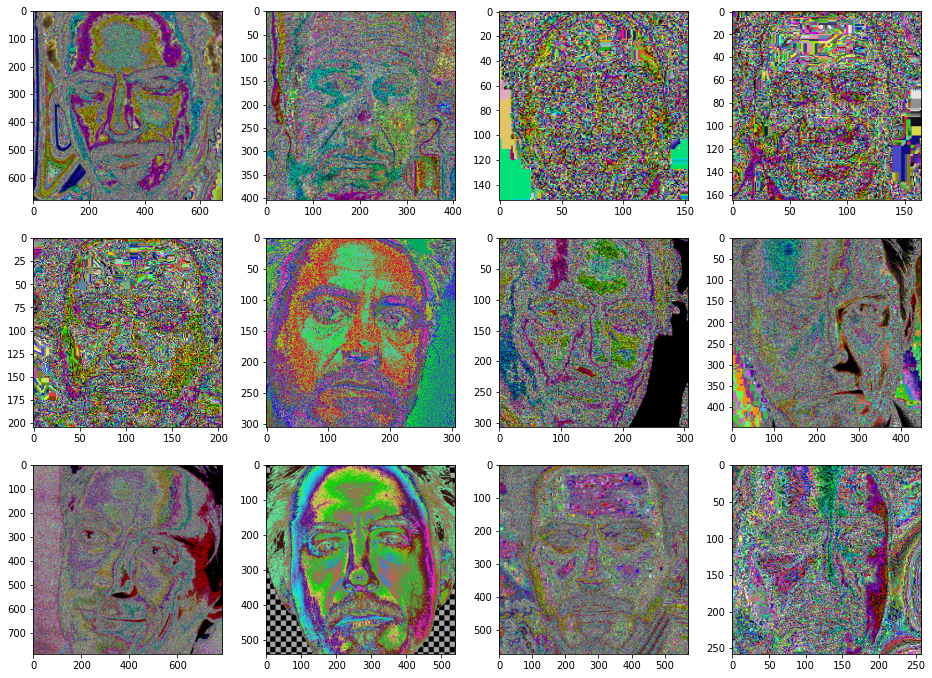

In [27]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR)
    show_img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    gamma= 2
    effected_image= np.power(show_img, gamma)
    
    plt.subplot(4, 4, x+1)
    plt.imshow(effected_image)

plt.show()

-----------
## The Best Results

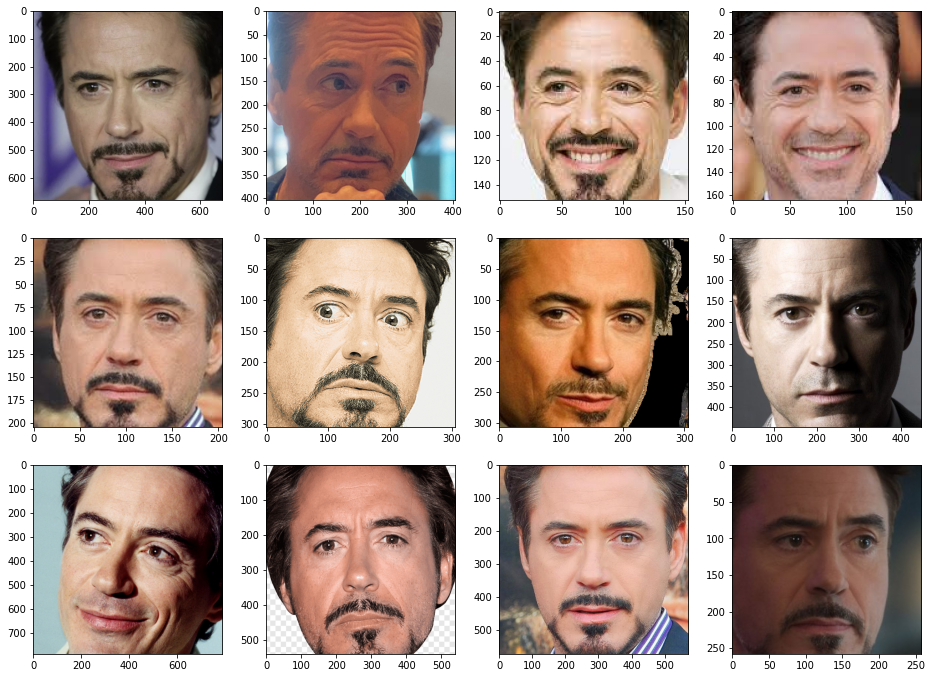

In [28]:
plt.figure(figsize=(16,16))

for x,i in enumerate(RDJ):
    
    img= cv2.imread(i, cv2.IMREAD_COLOR)
    show_img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.subplot(4, 4, x+1)

    #Creating_Mask
    Mask = np.zeros(img.shape[:2], np.uint8)
    Mask[0:2000, 0:2000] = 255   #Adjusting_the_mask_size
    Masked_img = cv2.bitwise_and(img, img, mask= Mask)
    Show_masked_img = cv2.bitwise_and(show_img, show_img, mask= Mask)
    
    plt.imshow(Show_masked_img,cmap='gray')

plt.show()

--------------